In [ ]:
!pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121

Looking in indexes: https://download.pytorch.org/whl/cu121
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.5/780.5 MB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 54.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 67.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.

In [ ]:
!pip install numpy matplotlib

In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: joviremen
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/badasstechie/celebahq-resized-256x256


100%|██████████| 283M/283M [00:13<00:00, 21.3MB/s]


In [ ]:
import os

DATA_DIR = '/content/celebahq-resized-256x256'
print(os.listdir(DATA_DIR))

['celeba_hq_256']


In [ ]:
print(os.listdir(DATA_DIR+'/celeba_hq_256')[:10])

['21967.jpg', '11406.jpg', '02443.jpg', '27746.jpg', '25555.jpg', '28982.jpg', '24123.jpg', '27702.jpg', '20326.jpg', '13469.jpg']


In [ ]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [ ]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

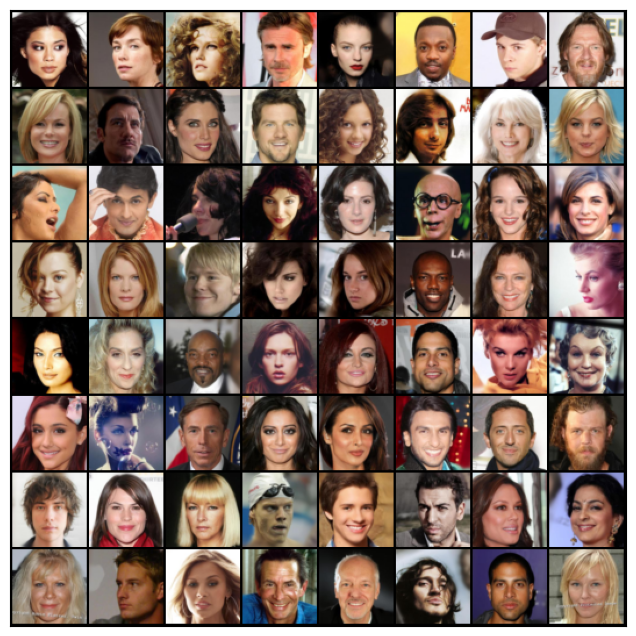

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


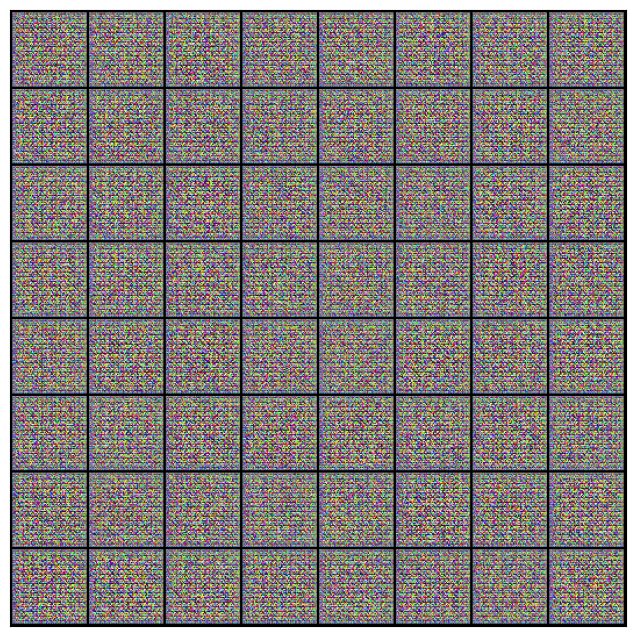

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


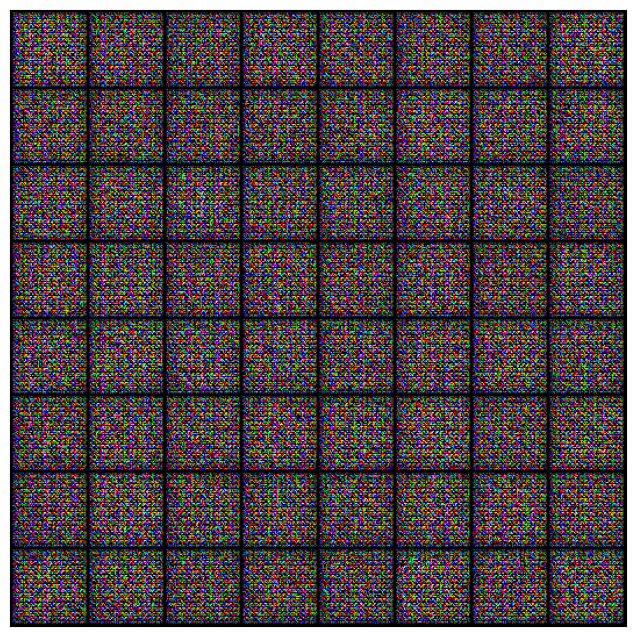

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.0002
epochs = 100

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 6.5034, loss_d: 0.0682, real_score: 0.9651, fake_score: 0.0283
Saving generated-images-0001.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 1.6997, loss_d: 0.1412, real_score: 0.9607, fake_score: 0.0889
Saving generated-images-0002.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 1.2753, loss_d: 0.7962, real_score: 0.5488, fake_score: 0.0194
Saving generated-images-0003.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 3.0714, loss_d: 1.0970, real_score: 0.4093, fake_score: 0.0050
Saving generated-images-0004.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 3.6030, loss_d: 0.3124, real_score: 0.7958, fake_score: 0.0578
Saving generated-images-0005.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 4.9193, loss_d: 0.8426, real_score: 0.9849, fake_score: 0.4960
Saving generated-images-0006.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 3.3679, loss_d: 0.4775, real_score: 0.6874, fake_score: 0.0309
Saving generated-images-0007.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 3.7961, loss_d: 0.5237, real_score: 0.8309, fake_score: 0.2414
Saving generated-images-0008.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 3.7662, loss_d: 0.3008, real_score: 0.8857, fake_score: 0.1461
Saving generated-images-0009.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 5.1380, loss_d: 0.4798, real_score: 0.9063, fake_score: 0.2781
Saving generated-images-0010.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 1.9922, loss_d: 0.5827, real_score: 0.7419, fake_score: 0.1918
Saving generated-images-0011.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 2.8897, loss_d: 0.2344, real_score: 0.9316, fake_score: 0.1313
Saving generated-images-0012.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 0.4190, loss_d: 0.9735, real_score: 0.4536, fake_score: 0.0343
Saving generated-images-0013.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 3.7663, loss_d: 0.2110, real_score: 0.8722, fake_score: 0.0570
Saving generated-images-0014.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 4.3388, loss_d: 0.4249, real_score: 0.9633, fake_score: 0.2885
Saving generated-images-0015.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 3.6124, loss_d: 0.2327, real_score: 0.9095, fake_score: 0.1189
Saving generated-images-0016.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 3.9549, loss_d: 0.4380, real_score: 0.7034, fake_score: 0.0322
Saving generated-images-0017.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 3.6369, loss_d: 0.2926, real_score: 0.9262, fake_score: 0.1749
Saving generated-images-0018.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 1.2564, loss_d: 0.4645, real_score: 0.7226, fake_score: 0.0909
Saving generated-images-0019.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 3.8287, loss_d: 0.2840, real_score: 0.9424, fake_score: 0.1884
Saving generated-images-0020.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 4.1888, loss_d: 0.1803, real_score: 0.9302, fake_score: 0.0910
Saving generated-images-0021.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 4.1784, loss_d: 0.2718, real_score: 0.9413, fake_score: 0.1732
Saving generated-images-0022.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 2.0683, loss_d: 0.5825, real_score: 0.6790, fake_score: 0.1030
Saving generated-images-0023.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 3.6014, loss_d: 0.1620, real_score: 0.9616, fake_score: 0.1095
Saving generated-images-0024.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 1.8487, loss_d: 0.3508, real_score: 0.7789, fake_score: 0.0632
Saving generated-images-0025.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 7.0470, loss_d: 0.8526, real_score: 0.9808, fake_score: 0.5107
Saving generated-images-0026.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 2.3448, loss_d: 0.3705, real_score: 0.7994, fake_score: 0.1072
Saving generated-images-0027.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 5.3293, loss_d: 0.1573, real_score: 0.9654, fake_score: 0.1082
Saving generated-images-0028.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 4.2705, loss_d: 0.2990, real_score: 0.9519, fake_score: 0.1985
Saving generated-images-0029.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 2.6695, loss_d: 0.2752, real_score: 0.8923, fake_score: 0.1284
Saving generated-images-0030.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 9.5677, loss_d: 2.3863, real_score: 0.9901, fake_score: 0.8490
Saving generated-images-0031.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 3.9122, loss_d: 0.1803, real_score: 0.9470, fake_score: 0.1108
Saving generated-images-0032.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 4.2181, loss_d: 0.0935, real_score: 0.9619, fake_score: 0.0512
Saving generated-images-0033.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 4.2757, loss_d: 0.4598, real_score: 0.8762, fake_score: 0.2429
Saving generated-images-0034.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 3.7933, loss_d: 0.2342, real_score: 0.8924, fake_score: 0.0994
Saving generated-images-0035.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 2.6228, loss_d: 0.5146, real_score: 0.6408, fake_score: 0.0080
Saving generated-images-0036.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 2.8394, loss_d: 0.2300, real_score: 0.8707, fake_score: 0.0763
Saving generated-images-0037.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 3.0417, loss_d: 0.1522, real_score: 0.9096, fake_score: 0.0483
Saving generated-images-0038.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 2.1068, loss_d: 0.2401, real_score: 0.8611, fake_score: 0.0471
Saving generated-images-0039.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 3.2483, loss_d: 0.1400, real_score: 0.9564, fake_score: 0.0847
Saving generated-images-0040.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 2.6430, loss_d: 0.2548, real_score: 0.8542, fake_score: 0.0780
Saving generated-images-0041.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 4.0715, loss_d: 0.1567, real_score: 0.9383, fake_score: 0.0818
Saving generated-images-0042.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 2.0609, loss_d: 0.3312, real_score: 0.8200, fake_score: 0.0835
Saving generated-images-0043.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 3.1534, loss_d: 0.1549, real_score: 0.8910, fake_score: 0.0293
Saving generated-images-0044.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 5.0354, loss_d: 1.2548, real_score: 0.9845, fake_score: 0.6177
Saving generated-images-0045.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 3.4475, loss_d: 0.0651, real_score: 0.9644, fake_score: 0.0271
Saving generated-images-0046.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 4.9646, loss_d: 0.6714, real_score: 0.9924, fake_score: 0.4129
Saving generated-images-0047.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 4.2044, loss_d: 0.0523, real_score: 0.9830, fake_score: 0.0337
Saving generated-images-0048.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 4.9562, loss_d: 0.8634, real_score: 0.9691, fake_score: 0.4677
Saving generated-images-0049.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 0.4143, loss_d: 1.8160, real_score: 0.2324, fake_score: 0.0004
Saving generated-images-0050.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 2.4892, loss_d: 0.3029, real_score: 0.8012, fake_score: 0.0517
Saving generated-images-0051.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 5.8936, loss_d: 0.1556, real_score: 0.9816, fake_score: 0.1189
Saving generated-images-0052.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 4.2516, loss_d: 0.1484, real_score: 0.9287, fake_score: 0.0644
Saving generated-images-0053.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 3.6092, loss_d: 0.0996, real_score: 0.9545, fake_score: 0.0394
Saving generated-images-0054.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 3.5294, loss_d: 0.1346, real_score: 0.9156, fake_score: 0.0370
Saving generated-images-0055.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 3.2503, loss_d: 0.1943, real_score: 0.9047, fake_score: 0.0780
Saving generated-images-0056.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 4.2049, loss_d: 0.2089, real_score: 0.9718, fake_score: 0.1521
Saving generated-images-0057.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 3.6800, loss_d: 0.1180, real_score: 0.9614, fake_score: 0.0717
Saving generated-images-0058.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 4.6646, loss_d: 0.1989, real_score: 0.8616, fake_score: 0.0206
Saving generated-images-0059.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 6.8345, loss_d: 3.5818, real_score: 0.9988, fake_score: 0.9160
Saving generated-images-0060.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 1.2863, loss_d: 0.4651, real_score: 0.7190, fake_score: 0.0626
Saving generated-images-0061.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 1.6653, loss_d: 1.3110, real_score: 0.3584, fake_score: 0.0010
Saving generated-images-0062.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 8.0232, loss_d: 1.4185, real_score: 0.9887, fake_score: 0.6534
Saving generated-images-0063.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 1.0348, loss_d: 3.5186, real_score: 0.0599, fake_score: 0.0015
Saving generated-images-0064.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 0.2559, loss_d: 0.4026, real_score: 0.7199, fake_score: 0.0168
Saving generated-images-0065.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 3.7156, loss_d: 0.0788, real_score: 0.9541, fake_score: 0.0283
Saving generated-images-0066.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 2.3579, loss_d: 0.4814, real_score: 0.7434, fake_score: 0.0543
Saving generated-images-0067.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.3660, loss_d: 0.1303, real_score: 0.9949, fake_score: 0.1088
Saving generated-images-0068.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 4.5899, loss_d: 0.1430, real_score: 0.9811, fake_score: 0.1062
Saving generated-images-0069.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 5.4814, loss_d: 0.2523, real_score: 0.9402, fake_score: 0.1489
Saving generated-images-0070.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 4.3944, loss_d: 0.1212, real_score: 0.9522, fake_score: 0.0522
Saving generated-images-0071.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 4.0875, loss_d: 0.1720, real_score: 0.9122, fake_score: 0.0667
Saving generated-images-0072.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 4.3283, loss_d: 0.1063, real_score: 0.9348, fake_score: 0.0336
Saving generated-images-0073.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 5.1351, loss_d: 0.6872, real_score: 0.9808, fake_score: 0.4180
Saving generated-images-0074.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 3.9692, loss_d: 0.1573, real_score: 0.8848, fake_score: 0.0226
Saving generated-images-0075.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 4.6065, loss_d: 0.0872, real_score: 0.9540, fake_score: 0.0361
Saving generated-images-0076.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 4.2576, loss_d: 0.0545, real_score: 0.9545, fake_score: 0.0067
Saving generated-images-0077.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 2.0554, loss_d: 0.6960, real_score: 0.5890, fake_score: 0.0298
Saving generated-images-0078.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 3.9312, loss_d: 0.1602, real_score: 0.8866, fake_score: 0.0269
Saving generated-images-0079.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 4.5009, loss_d: 0.0821, real_score: 0.9344, fake_score: 0.0087
Saving generated-images-0080.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 4.6667, loss_d: 0.0553, real_score: 0.9745, fake_score: 0.0278
Saving generated-images-0081.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 4.5285, loss_d: 0.1360, real_score: 0.9443, fake_score: 0.0641
Saving generated-images-0082.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 3.1069, loss_d: 0.1230, real_score: 0.9483, fake_score: 0.0571
Saving generated-images-0083.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 3.1165, loss_d: 0.4828, real_score: 0.8678, fake_score: 0.2404
Saving generated-images-0084.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 3.4117, loss_d: 0.2761, real_score: 0.9005, fake_score: 0.1094
Saving generated-images-0085.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 5.2083, loss_d: 0.0474, real_score: 0.9730, fake_score: 0.0174
Saving generated-images-0086.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 4.7170, loss_d: 0.2607, real_score: 0.8959, fake_score: 0.1140
Saving generated-images-0087.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 4.8350, loss_d: 0.0864, real_score: 0.9669, fake_score: 0.0488
Saving generated-images-0088.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 3.1752, loss_d: 0.1558, real_score: 0.9044, fake_score: 0.0470
Saving generated-images-0089.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 4.0855, loss_d: 0.0735, real_score: 0.9681, fake_score: 0.0357
Saving generated-images-0090.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 4.2902, loss_d: 0.0685, real_score: 0.9600, fake_score: 0.0248
Saving generated-images-0091.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 5.5572, loss_d: 0.1722, real_score: 0.9246, fake_score: 0.0662
Saving generated-images-0092.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 4.3237, loss_d: 0.2729, real_score: 0.9341, fake_score: 0.1596
Saving generated-images-0093.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 5.1952, loss_d: 0.0739, real_score: 0.9816, fake_score: 0.0494
Saving generated-images-0094.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 1.1155, loss_d: 0.3023, real_score: 0.7651, fake_score: 0.0118
Saving generated-images-0095.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 5.6095, loss_d: 0.0676, real_score: 0.9932, fake_score: 0.0546
Saving generated-images-0096.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 3.7662, loss_d: 0.2142, real_score: 0.8714, fake_score: 0.0297
Saving generated-images-0097.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 4.8323, loss_d: 0.0735, real_score: 0.9465, fake_score: 0.0159
Saving generated-images-0098.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 7.4598, loss_d: 0.1365, real_score: 0.9907, fake_score: 0.1101
Saving generated-images-0099.png


  0%|          | 0/235 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 7.0998, loss_d: 0.0086, real_score: 0.9951, fake_score: 0.0036
Saving generated-images-0100.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

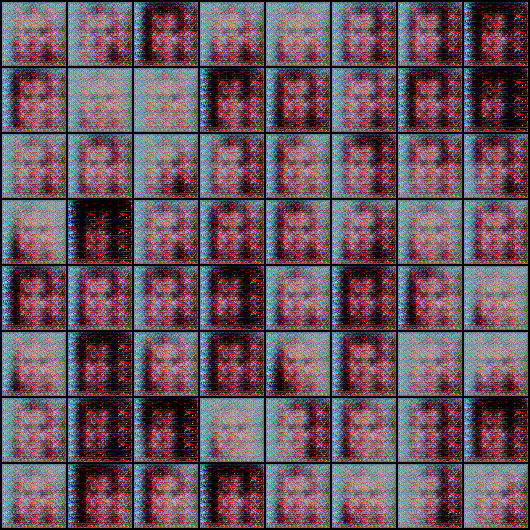

In [ ]:
Image('./generated/generated-images-0001.png')

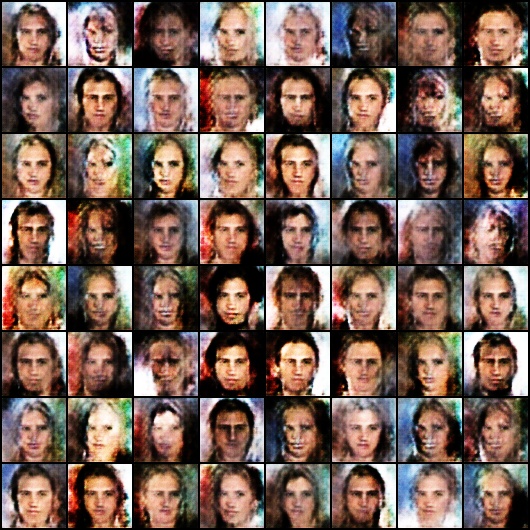

In [ ]:
Image('./generated/generated-images-0005.png')

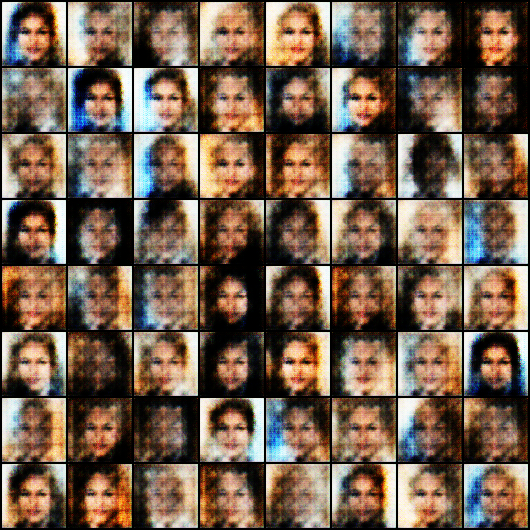

In [ ]:
Image('./generated/generated-images-0002.png')

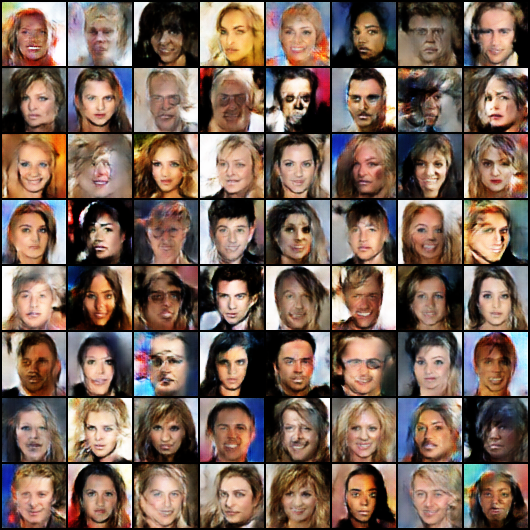

In [ ]:
Image('./generated/generated-images-0020.png')

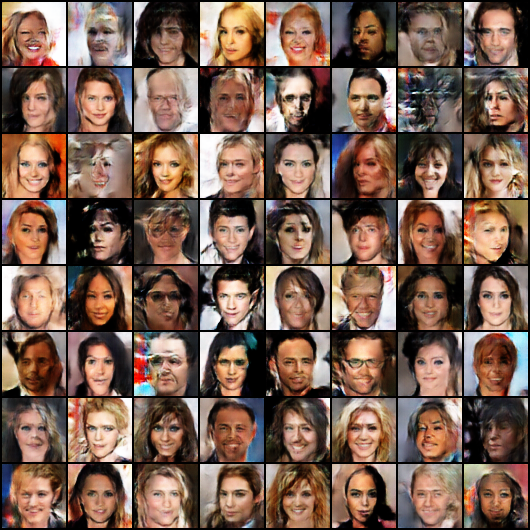

In [ ]:
Image('./generated/generated-images-0025.png')

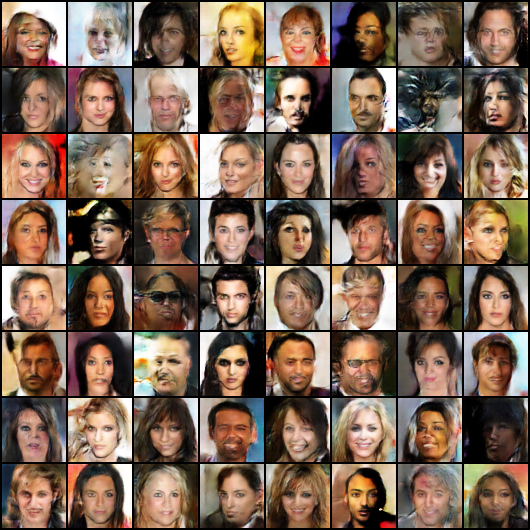

In [ ]:
Image('./generated/generated-images-0035.png')

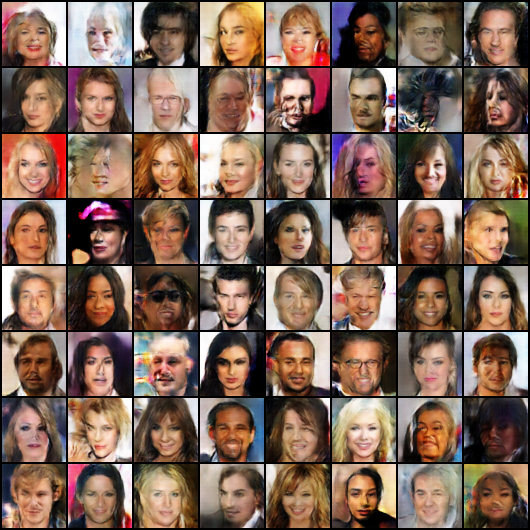

In [ ]:
Image('./generated/generated-images-0045.png')

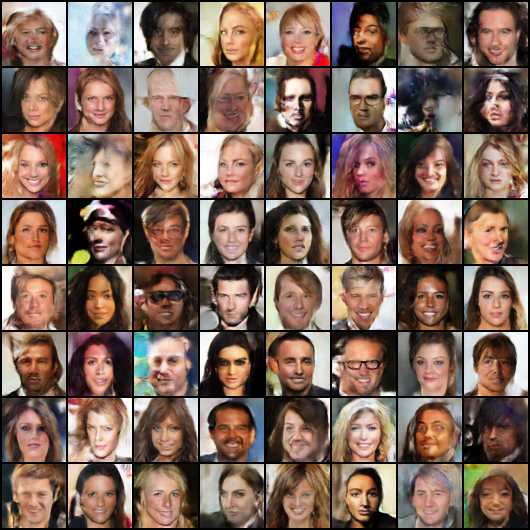

In [ ]:
Image('./generated/generated-images-0055.png')

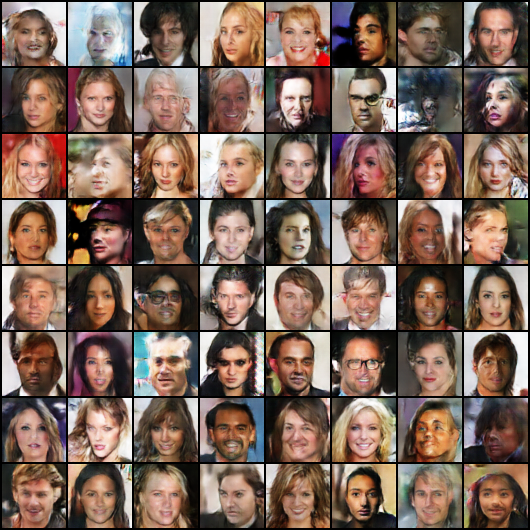

In [ ]:
Image('./generated/generated-images-0075.png')

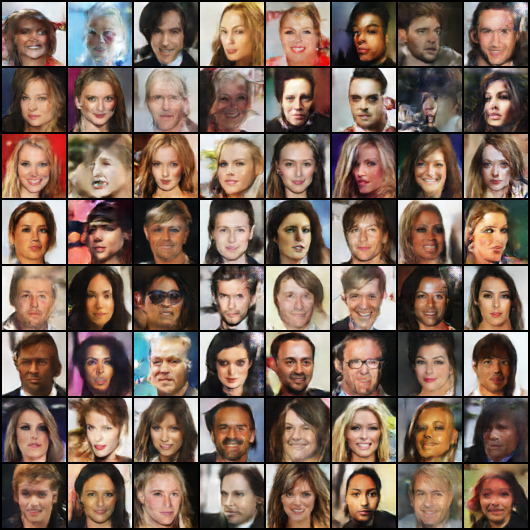

In [ ]:
Image('./generated/generated-images-0099.png')

In [ ]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

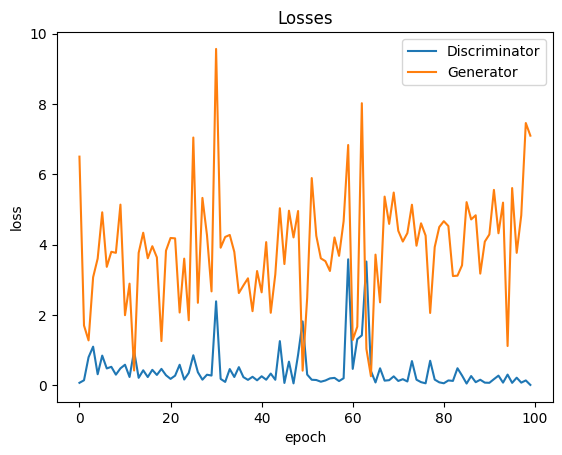

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

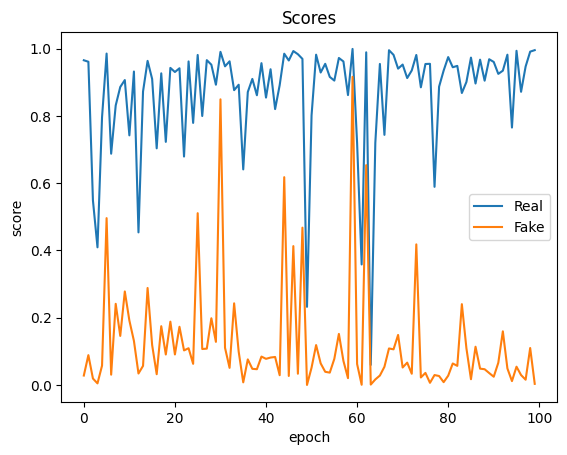

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');